# Module 3 Localization - Prediction Error Analysis

**Purpose**: Analyze worst-case model predictions and compare with ground truth.

**Model**: YOLOv11s-Pose (exp001_baseline)

**Analysis**:
1. 🔍 Load model predictions and ground truth labels
2. 📊 Calculate per-image error metrics (MDE, IoU, Topology)
3. 🔴 Identify worst-performing images
4. 🖼️ Visualize prediction vs ground truth overlays
5. 📝 Generate insights for model improvement

**Date**: December 25, 2025

In [1]:
# Import Required Libraries
import numpy as np
import cv2
import yaml
import json
from pathlib import Path
from typing import List, Dict, Tuple
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon as MplPolygon
from shapely.geometry import Polygon
import pandas as pd
from ultralytics import YOLO

# Configure matplotlib
plt.rcParams["figure.figsize"] = (20, 12)
plt.rcParams["font.size"] = 10

print("✅ Libraries imported successfully")

✅ Libraries imported successfully


## 1. Load Configuration and Model

In [2]:
# Load data configuration
data_yaml_path = Path("../data/processed/localization/data.yaml")

with open(data_yaml_path, "r") as f:
    data_config = yaml.safe_load(f)

# Resolve paths
dataset_path = Path(data_config["path"])
if not dataset_path.is_absolute():
    dataset_path = (Path("..") / dataset_path).resolve()

test_images_dir = dataset_path / data_config["val"]  # Use validation set for analysis
test_labels_dir = dataset_path / "labels" / "val"

# Load model
model_path = Path("../weights/localization/best.pt")
model = YOLO(str(model_path))

print(f"📂 Dataset: {dataset_path}")
print(f"🖼️  Test images dir: {test_images_dir}")
print(f"🤖 Model loaded: {model_path}")
print(f"📊 Number of test images: {len(list(test_images_dir.glob('*.jpg')))}")

📂 Dataset: E:\container-id-research\data\processed\localization
🖼️  Test images dir: E:\container-id-research\data\processed\localization\images\val
🤖 Model loaded: ..\weights\localization\best.pt
📊 Number of test images: 74


## 2. Run Inference and Calculate Errors

In [3]:
def load_gt_label(label_path: Path) -> np.ndarray:
    """Load ground truth keypoints from YOLO pose format."""
    if not label_path.exists():
        return None

    with open(label_path, "r") as f:
        line = f.readline().strip()

    if not line:
        return None

    parts = line.split()
    if len(parts) < 17:
        return None

    keypoints = []
    for i in range(4):
        idx = 5 + i * 3
        px = float(parts[idx])
        py = float(parts[idx + 1])
        keypoints.append([px, py])

    return np.array(keypoints, dtype=np.float32)


def compute_mde(pred_kpts: np.ndarray, gt_kpts: np.ndarray, img_size: tuple) -> float:
    """Calculate Mean Euclidean Distance Error in pixels."""
    h, w = img_size
    pred_px = pred_kpts * np.array([w, h])
    gt_px = gt_kpts * np.array([w, h])

    distances = np.sqrt(np.sum((pred_px - gt_px) ** 2, axis=1))
    return np.mean(distances)


def compute_polygon_iou(pred_kpts: np.ndarray, gt_kpts: np.ndarray) -> float:
    """Calculate Polygon IoU."""
    try:
        pred_poly = Polygon(pred_kpts)
        gt_poly = Polygon(gt_kpts)

        if not pred_poly.is_valid or not gt_poly.is_valid:
            return 0.0

        intersection = pred_poly.intersection(gt_poly).area
        union = pred_poly.union(gt_poly).area

        if union == 0:
            return 0.0

        return intersection / union
    except:
        return 0.0


print("✅ Helper functions defined")

✅ Helper functions defined


In [4]:
# Run inference on all test images and calculate errors
test_images = sorted(test_images_dir.glob("*.jpg"))
results_data = []

print(f"🔄 Running inference on {len(test_images)} images...")

for img_path in test_images:
    # Load GT label
    label_path = test_labels_dir / f"{img_path.stem}.txt"
    gt_kpts = load_gt_label(label_path)

    if gt_kpts is None:
        continue

    # Run model inference
    results = model.predict(str(img_path), conf=0.6, verbose=False)

    # Check if model detected anything
    if len(results[0].boxes) == 0:
        # No detection
        results_data.append(
            {
                "image": img_path.name,
                "detected": False,
                "mde": float("inf"),
                "iou": 0.0,
                "gt_kpts": gt_kpts,
                "pred_kpts": None,
            }
        )
        continue

    # Get prediction (use highest confidence if multiple)
    if len(results[0].boxes) > 1:
        confidences = results[0].boxes.conf.cpu().numpy()
        best_idx = np.argmax(confidences)
        pred_kpts_obj = results[0].keypoints[best_idx]
    else:
        pred_kpts_obj = results[0].keypoints[0]

    # Extract keypoints
    pred_kpts_raw = pred_kpts_obj.xy.cpu().numpy()
    if pred_kpts_raw.ndim == 3:
        pred_kpts_raw = pred_kpts_raw[0]

    # Get image size
    img = cv2.imread(str(img_path))
    h, w = img.shape[:2]

    # Normalize predictions to [0, 1]
    pred_kpts = pred_kpts_raw / np.array([w, h])

    # Calculate metrics
    mde = compute_mde(pred_kpts, gt_kpts, (h, w))
    iou = compute_polygon_iou(pred_kpts, gt_kpts)

    results_data.append(
        {
            "image": img_path.name,
            "detected": True,
            "mde": mde,
            "iou": iou,
            "gt_kpts": gt_kpts,
            "pred_kpts": pred_kpts,
        }
    )

# Convert to DataFrame
df = pd.DataFrame(results_data)

print(f"\n✅ Inference complete!")
print(f"📊 Total images: {len(df)}")
print(f"🎯 Detected: {df['detected'].sum()}")
print(f"❌ Missed: {(~df['detected']).sum()}")
print(f"\n📏 MDE Statistics:")
print(f"   Mean: {df[df['detected']]['mde'].mean():.2f} px")
print(f"   Median: {df[df['detected']]['mde'].median():.2f} px")
print(f"   Max: {df[df['detected']]['mde'].max():.2f} px")
print(f"\n🔷 IoU Statistics:")
print(f"   Mean: {df[df['detected']]['iou'].mean():.3f}")
print(f"   Median: {df[df['detected']]['iou'].median():.3f}")
print(f"   Min: {df[df['detected']]['iou'].min():.3f}")

🔄 Running inference on 74 images...



✅ Inference complete!
📊 Total images: 74
🎯 Detected: 74
❌ Missed: 0

📏 MDE Statistics:
   Mean: 14.92 px
   Median: 12.44 px
   Max: 49.42 px

🔷 IoU Statistics:
   Mean: 0.647
   Median: 0.647
   Min: 0.244


## 3. Identify Worst-Case Predictions

In [5]:
# Sort by different error metrics
df_detected = df[df["detected"]].copy()

# Top 10 worst by MDE
worst_mde = df_detected.nlargest(10, "mde")
print("🔴 Top 10 Worst Cases by MDE:")
print(worst_mde[["image", "mde", "iou"]])

# Top 10 worst by IoU
worst_iou = df_detected.nsmallest(10, "iou")
print("\n🔴 Top 10 Worst Cases by IoU:")
print(worst_iou[["image", "mde", "iou"]])

🔴 Top 10 Worst Cases by MDE:
          image        mde       iou
71  0024620.jpg  49.420003  0.244169
46  0015818.jpg  43.704925  0.537629
7   0002254.jpg  41.433276  0.458378
1   0000374.jpg  37.136424  0.577803
64  0021605.jpg  29.418710  0.544165
31  0009791.jpg  29.064175  0.714631
15  0003380.jpg  28.537121  0.564193
8   0002346.jpg  27.749368  0.587797
68  0022943.jpg  25.823659  0.659436
37  0012695.jpg  22.126163  0.760310

🔴 Top 10 Worst Cases by IoU:
          image        mde       iou
71  0024620.jpg  49.420003  0.244169
7   0002254.jpg  41.433276  0.458378
0   0000287.jpg  18.675268  0.464870
32  0010096.jpg  21.937403  0.474821
50  0017715.jpg  18.109865  0.488052
59  0020193.jpg  13.649259  0.491046
39  0014201.jpg  16.601459  0.499689
46  0015818.jpg  43.704925  0.537629
64  0021605.jpg  29.418710  0.544165
38  0012710.jpg   8.563467  0.548274


## 4. Visualize Worst Cases (Prediction vs Ground Truth)

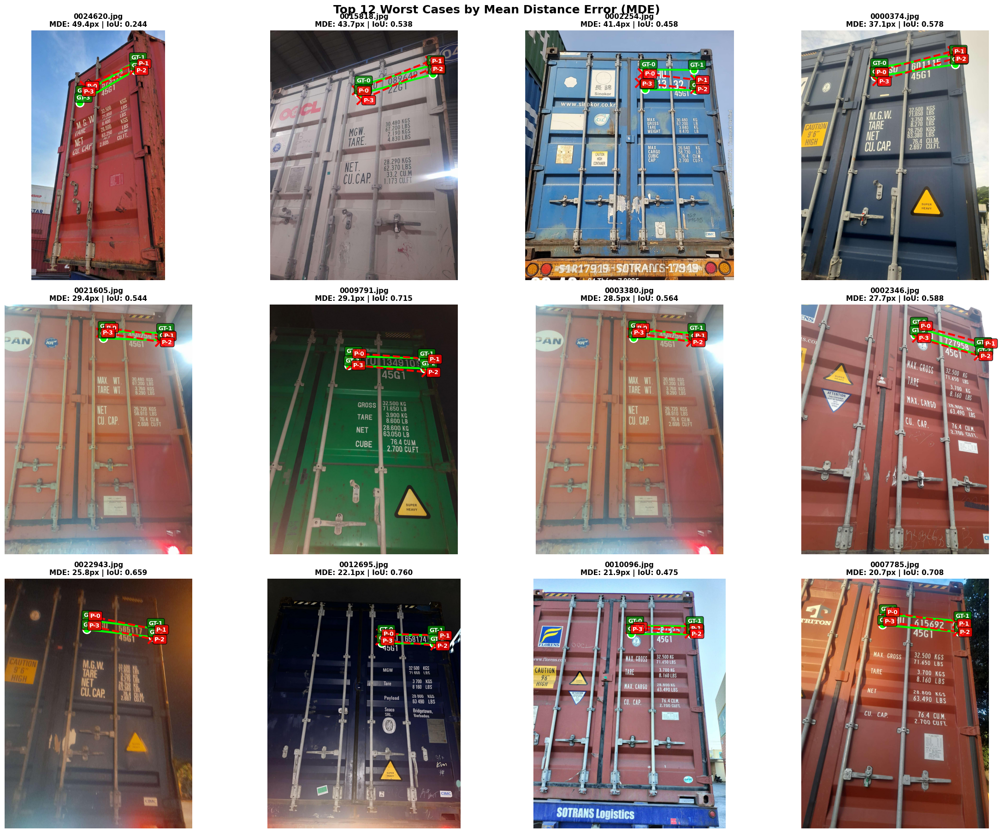

In [6]:
def visualize_comparison(
    img_path: Path,
    gt_kpts: np.ndarray,
    pred_kpts: np.ndarray,
    mde: float,
    iou: float,
    ax,
):
    """Visualize Ground Truth (green) vs Prediction (red) overlay."""
    # Load image
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    ax.imshow(img)

    # Convert to pixel coordinates
    gt_px = gt_kpts * np.array([w, h])
    pred_px = pred_kpts * np.array([w, h])

    # Draw GT polygon (GREEN)
    gt_polygon = MplPolygon(
        gt_px, fill=False, edgecolor="lime", linewidth=3, label="Ground Truth"
    )
    ax.add_patch(gt_polygon)

    # Draw Prediction polygon (RED)
    pred_polygon = MplPolygon(
        pred_px,
        fill=False,
        edgecolor="red",
        linewidth=3,
        linestyle="--",
        label="Prediction",
    )
    ax.add_patch(pred_polygon)

    # Draw GT keypoints (GREEN circles)
    colors_gt = ["#00ff00", "#00ff00", "#00ff00", "#00ff00"]  # All green
    for i, pt in enumerate(gt_px):
        ax.plot(
            pt[0],
            pt[1],
            "o",
            color=colors_gt[i],
            markersize=12,
            markeredgecolor="white",
            markeredgewidth=2,
            label="GT" if i == 0 else "",
        )
        ax.text(
            pt[0] - 25,
            pt[1] - 25,
            f"GT-{i}",
            color="white",
            fontsize=9,
            fontweight="bold",
            bbox=dict(boxstyle="round,pad=0.3", facecolor="green", alpha=0.8),
        )

    # Draw Prediction keypoints (RED crosses)
    for i, pt in enumerate(pred_px):
        ax.plot(
            pt[0],
            pt[1],
            "x",
            color="red",
            markersize=14,
            markeredgewidth=3,
            label="Pred" if i == 0 else "",
        )
        ax.text(
            pt[0] + 15,
            pt[1] + 15,
            f"P-{i}",
            color="white",
            fontsize=9,
            fontweight="bold",
            bbox=dict(boxstyle="round,pad=0.3", facecolor="red", alpha=0.8),
        )

    # Draw error lines
    for i in range(4):
        ax.plot(
            [gt_px[i, 0], pred_px[i, 0]],
            [gt_px[i, 1], pred_px[i, 1]],
            "y--",
            linewidth=1,
            alpha=0.5,
        )

    # Title with error metrics
    ax.set_title(
        f"{img_path.name}\nMDE: {mde:.1f}px | IoU: {iou:.3f}",
        fontsize=11,
        fontweight="bold",
    )
    ax.axis("off")


# Visualize top 12 worst cases by MDE
fig, axes = plt.subplots(3, 4, figsize=(24, 18))
axes = axes.flatten()

worst_cases = df_detected.nlargest(12, "mde")

for idx, (_, row) in enumerate(worst_cases.iterrows()):
    img_path = test_images_dir / row["image"]
    visualize_comparison(
        img_path,
        row["gt_kpts"],
        row["pred_kpts"],
        row["mde"],
        row["iou"],
        axes[idx],
    )

plt.tight_layout()
plt.suptitle(
    "Top 12 Worst Cases by Mean Distance Error (MDE)",
    fontsize=18,
    fontweight="bold",
    y=1.002,
)
plt.show()

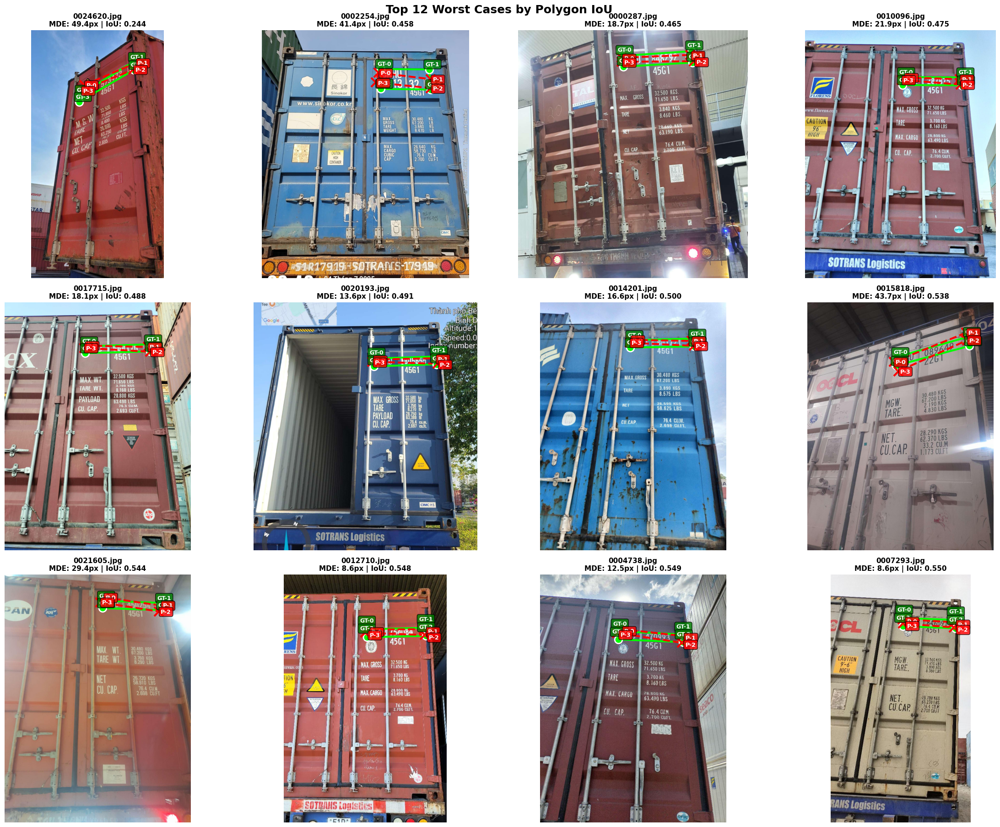

In [7]:
# Visualize bottom 12 worst cases by IoU
fig, axes = plt.subplots(3, 4, figsize=(24, 18))
axes = axes.flatten()

worst_iou_cases = df_detected.nsmallest(12, "iou")

for idx, (_, row) in enumerate(worst_iou_cases.iterrows()):
    img_path = test_images_dir / row["image"]
    visualize_comparison(
        img_path,
        row["gt_kpts"],
        row["pred_kpts"],
        row["mde"],
        row["iou"],
        axes[idx],
    )

plt.tight_layout()
plt.suptitle(
    "Top 12 Worst Cases by Polygon IoU", fontsize=18, fontweight="bold", y=1.002
)
plt.show()

## 5. Per-Keypoint Error Analysis

Per-Keypoint Error Statistics (in pixels):
        Top-Left  Top-Right  Bottom-Right  Bottom-Left
count  74.000000  74.000000     74.000000    74.000000
mean   12.065262  13.909688     10.191362    23.503784
std    11.842486  10.887236      8.807986    13.832678
min     0.148394   3.127478      1.874925     2.768330
25%     6.091409   6.188309      4.798635    13.826237
50%     9.288679  10.849140      7.408151    20.068486
75%    13.530959  17.236975     13.323801    30.181111
max    82.070521  67.984652     47.755436    87.752060


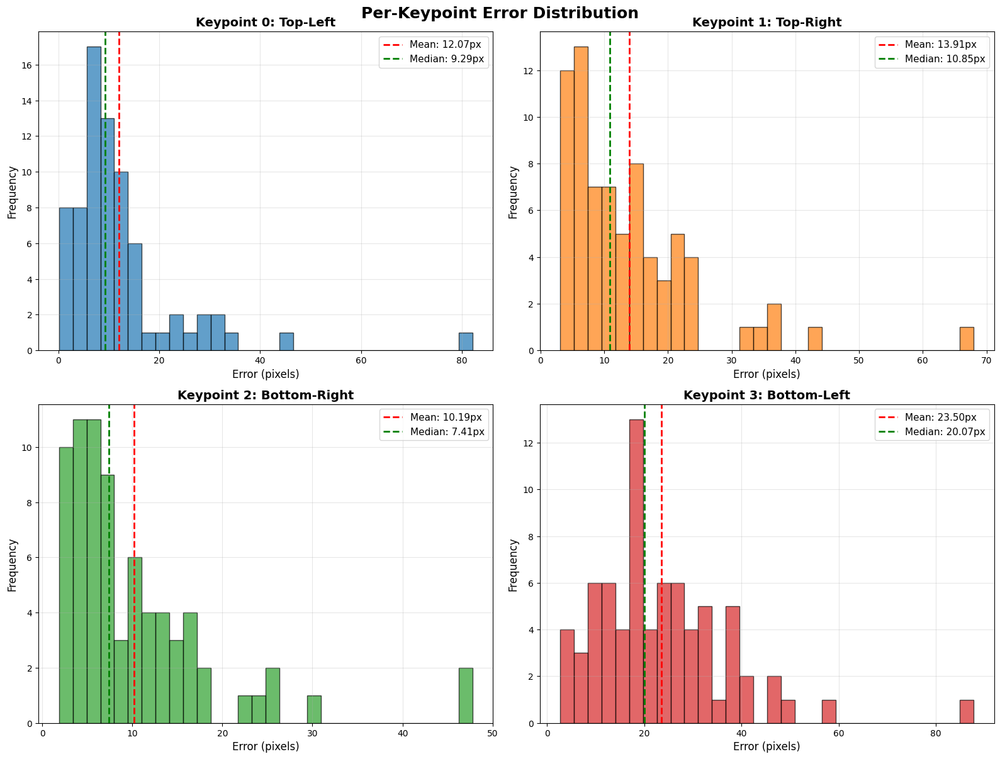

In [8]:
# Calculate per-keypoint errors
keypoint_errors = {0: [], 1: [], 2: [], 3: []}
keypoint_names = {0: "Top-Left", 1: "Top-Right", 2: "Bottom-Right", 3: "Bottom-Left"}

for _, row in df_detected.iterrows():
    img_path = test_images_dir / row["image"]
    img = cv2.imread(str(img_path))
    h, w = img.shape[:2]

    gt_px = row["gt_kpts"] * np.array([w, h])
    pred_px = row["pred_kpts"] * np.array([w, h])

    for i in range(4):
        error = np.linalg.norm(pred_px[i] - gt_px[i])
        keypoint_errors[i].append(error)

# Convert to DataFrame for analysis
kpt_error_df = pd.DataFrame(keypoint_errors)
kpt_error_df.columns = [keypoint_names[i] for i in range(4)]

print("Per-Keypoint Error Statistics (in pixels):")
print(kpt_error_df.describe())

# Visualize distribution
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for i, (kpt_name, ax) in enumerate(zip(keypoint_names.values(), axes)):
    ax.hist(keypoint_errors[i], bins=30, edgecolor="black", alpha=0.7, color=f"C{i}")
    ax.axvline(
        np.mean(keypoint_errors[i]),
        color="red",
        linestyle="--",
        linewidth=2,
        label=f"Mean: {np.mean(keypoint_errors[i]):.2f}px",
    )
    ax.axvline(
        np.median(keypoint_errors[i]),
        color="green",
        linestyle="--",
        linewidth=2,
        label=f"Median: {np.median(keypoint_errors[i]):.2f}px",
    )
    ax.set_xlabel("Error (pixels)", fontsize=12)
    ax.set_ylabel("Frequency", fontsize=12)
    ax.set_title(f"Keypoint {i}: {kpt_name}", fontsize=14, fontweight="bold")
    ax.legend(fontsize=11)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.suptitle("Per-Keypoint Error Distribution", fontsize=18, fontweight="bold", y=1.002)
plt.show()

## 6. Key Insights and Recommendations

In [9]:
# Generate insights
print("=" * 80)
print("PREDICTION ERROR ANALYSIS SUMMARY")
print("=" * 80)

print(f"\n1️⃣  OVERALL PERFORMANCE:")
print(f"   • Total test images: {len(df)}")
print(f"   • Detection rate: {len(df_detected)/len(df)*100:.1f}%")
print(
    f"   • Mean Distance Error (MDE): {df_detected['mde'].mean():.2f} ± {df_detected['mde'].std():.2f} px"
)
print(
    f"   • Polygon IoU: {df_detected['iou'].mean():.3f} ± {df_detected['iou'].std():.3f}"
)

print(f"\n2️⃣  PER-KEYPOINT ERRORS:")
for i, name in keypoint_names.items():
    mean_err = np.mean(keypoint_errors[i])
    std_err = np.std(keypoint_errors[i])
    print(f"   • Keypoint {i} ({name:13}): {mean_err:6.2f} ± {std_err:5.2f} px")

# Identify most problematic keypoint
worst_kpt_idx = max(range(4), key=lambda i: np.mean(keypoint_errors[i]))
worst_kpt_name = keypoint_names[worst_kpt_idx]
worst_kpt_err = np.mean(keypoint_errors[worst_kpt_idx])

print(
    f"\n   ⚠️  Most problematic: Keypoint {worst_kpt_idx} ({worst_kpt_name}) with {worst_kpt_err:.2f}px mean error"
)

print(f"\n3️⃣  ERROR DISTRIBUTION:")
print(
    f"   • Images with MDE > 20px: {(df_detected['mde'] > 20).sum()} ({(df_detected['mde'] > 20).sum()/len(df_detected)*100:.1f}%)"
)
print(
    f"   • Images with IoU < 0.5: {(df_detected['iou'] < 0.5).sum()} ({(df_detected['iou'] < 0.5).sum()/len(df_detected)*100:.1f}%)"
)

print(f"\n4️⃣  RECOMMENDATIONS FOR RETRAINING:")

# Check if specific keypoints are consistently worse
kpt_means = [np.mean(keypoint_errors[i]) for i in range(4)]
max_kpt_mean = max(kpt_means)
min_kpt_mean = min(kpt_means)

if max_kpt_mean > min_kpt_mean * 1.5:
    print(
        f"   • ⚠️  Keypoint imbalance detected (max/min ratio: {max_kpt_mean/min_kpt_mean:.2f}x)"
    )
    print(f"      → Consider increasing `pose` weight in training config")
    print(f"      → Review labeling consistency for {worst_kpt_name} keypoint")

if df_detected["mde"].mean() > 10:
    print(f"   • ⚠️  High mean error ({df_detected['mde'].mean():.2f}px)")
    print(f"      → Increase training epochs (current: check experiment config)")
    print(f"      → Add data augmentation (perspective, affine transforms)")
    print(f"      → Review model architecture (try larger YOLOv11 variant)")

if (df_detected["iou"] < 0.7).sum() > len(df_detected) * 0.3:
    print(f"   • ⚠️  Low IoU on {(df_detected['iou'] < 0.7).sum()} images (>{30}%)")
    print(f"      → Increase box loss weight")
    print(f"      → Review bounding box quality in training data")

print(f"\n5️⃣  NEXT STEPS:")
print(f"   1. Review visualizations above to identify common failure patterns")
print(f"   2. Create new experiment config: experiments/002_loc_improved.yaml")
print(f"   3. Apply recommendations and retrain")
print(f"   4. Re-run this analysis notebook to compare improvements")

print("\n" + "=" * 80)

PREDICTION ERROR ANALYSIS SUMMARY

1️⃣  OVERALL PERFORMANCE:
   • Total test images: 74
   • Detection rate: 100.0%
   • Mean Distance Error (MDE): 14.92 ± 8.83 px
   • Polygon IoU: 0.647 ± 0.106

2️⃣  PER-KEYPOINT ERRORS:
   • Keypoint 0 (Top-Left     ):  12.07 ± 11.76 px
   • Keypoint 1 (Top-Right    ):  13.91 ± 10.81 px
   • Keypoint 2 (Bottom-Right ):  10.19 ±  8.75 px
   • Keypoint 3 (Bottom-Left  ):  23.50 ± 13.74 px

   ⚠️  Most problematic: Keypoint 3 (Bottom-Left) with 23.50px mean error

3️⃣  ERROR DISTRIBUTION:
   • Images with MDE > 20px: 13 (17.6%)
   • Images with IoU < 0.5: 7 (9.5%)

4️⃣  RECOMMENDATIONS FOR RETRAINING:
   • ⚠️  Keypoint imbalance detected (max/min ratio: 2.31x)
      → Consider increasing `pose` weight in training config
      → Review labeling consistency for Bottom-Left keypoint
   • ⚠️  High mean error (14.92px)
      → Increase training epochs (current: check experiment config)
      → Add data augmentation (perspective, affine transforms)
      → R